## Madmom (ran with the madmom mamba env)

RNNBeatProcessor = Pipeline applying (B)LSTM to varying-length STFTs

TCNBeatProcessor = Pipeline applying Temporal Convolutional Networks

what do these 2 return?

||
\\/

DBNBeatTrackingProcessor / CRFBeatDetectionProcessor

#### For song #96, evenBeats[::2] = 1, 3, 5, 7 => evenBeats = 1-8 => oddBeats = 0.5 1.5 ... 7.5 (somehow)

In [2]:
%matplotlib inline

import madmom
from madmom.evaluation import BeatEvaluation
import numpy as np
np.set_printoptions(formatter = {'float_kind': "{:.3f}".format})

import pandas as pd
from pathlib import Path
from librosa import clicks
import matplotlib.pyplot as plt
from IPython.display import Audio

N = 96
songPath = Path(f"~/Documents/theSalsaProject/audioFragments/{N}.wav").expanduser()

songsDF = pd.read_csv(songPath.parent.parent / Path("songdAndBeatData.csv"), index_col=0)
songsDF[songsDF["title"].str.lower().str.contains("soledad")]

,title,artist,year,album,acoustID
id,,,,,
79,Soledad,Sonora Ponceña,1982,Determination,8ac6089e-af01-4219-b2d5-e5de44f2760a


In [3]:
songsDF

,title,artist,year,album,acoustID
id,,,,,
1,A nuestro modo,Gabino Pampini,1986,Fuerza Noble,258db8e7-6136-4836-bf7a-41f8ab8c1aac
2,Aguzate,Richie Ray & Bobby Cruz,1970,Aguzate,b874c7c2-a702-4c70-8f74-1b7c56eee20d
3,Amor Traicionero,Guayacan Orquesta,1993,Con el Corazón Abíerto,cb7ea308-9264-4ff7-9b96-49bf42be0704
4,Arroz con habichuela,El Gran Combo de Puerto Rico,2006,Arroz con habichuela,d62f529a-969f-4696-b4d6-910a32bfef14
5,"Bang, Bang",Joe Cuba Sextet,1966,Wanted Dead or Alive,94c43fa0-4677-40af-8ef4-5ea98ef3a0eb
...,...,...,...,...,...
120,Amor y Control,Rubén Blades,1992,Amor y Control,78b37d37-d7d1-4b40-a3dd-1739c727f531
121,La Cita,Galy Galiano,1992,Solo Salsa,963c92dc-cc87-43aa-aac2-8d35f0a2873c
122,Lo Bueno Ya Viene,Lo Mejor de Cheo Feliciano con el Sexteto Joe ...,1974,Lo Mejor De Cheo Feliciano Con El Sexteto Joe ...,ec2f7f0c-8f85-48cc-8852-718e91466c08


In [ ]:
sig = madmom.audio.signal.Signal(data = songPath)
sig

Signal([   -1,     2,    -3, ..., -4052, -5323, -6231], dtype=int16)

In [3]:
Audio(sig.T, rate = sig.sample_rate)

In [18]:
rnn = madmom.features.beats.RNNBeatProcessor()
btp = madmom.features.beats.DBNBeatTrackingProcessor(fps = 100)
res = rnn(sig) 
oddBeats = btp(res)

evenBeats = (oddBeats[:-1] + oddBeats[1:]) / 2
evenBeats = np.append(evenBeats, 2 * evenBeats[-1] - evenBeats[-2])

beats = np.zeros((evenBeats.shape[0] + oddBeats.shape[0], ))
beats[ ::2] = oddBeats
beats[1::2] = evenBeats

In [7]:
sounds = clicks(times = evenBeats, sr = sig.sample_rate)
if sounds.shape[0] > sig.shape[0]:
    sounds = sounds[:sig.shape[0]]
else:
    sounds = np.pad(sounds, (0, sig.shape[0] - sounds.shape[0]), 'constant', constant_values = 0)

Audio(15000 * sounds + sig.T, rate = sig.sample_rate)

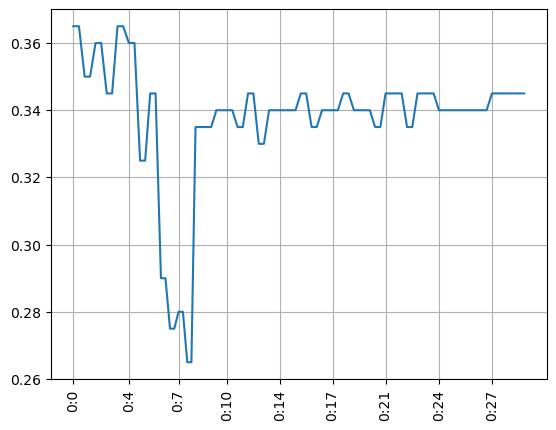

In [10]:
secondsToMins = np.vectorize(lambda t: f"{round(t) // 60}:{round(t) % 60}")
n = 10

plt.plot(beats[:-1], beats[1:] - beats[:-1])
plt.grid()

plt.xticks(beats[::n], secondsToMins(beats[::n]), rotation=90)
plt.show()

In [19]:
annotatedBeats = np.loadtxt(songPath.parent.parent / Path(f"beatAnnotations/{N}.txt")) / 1000
annotatedBeats = annotatedBeats[annotatedBeats < 30]
annotatedBeats

array([ 7.945,  8.536,  9.189,  9.863, 10.539, 11.239, 11.873, 12.576,
       13.232, 13.932, 14.599, 15.271, 15.976, 16.652, 17.305, 17.996,
       18.681, 19.385, 20.033, 20.709, 21.391, 22.092, 22.761, 23.431,
       24.099, 24.833, 25.489, 26.165, 26.879, 27.532, 28.193, 28.885,
       29.567])

In [20]:
oddBeats[oddBeats > 7.7]

array([ 7.81,  8.15,  8.5 ,  8.83,  9.18,  9.5 ,  9.86, 10.18, 10.54,
       10.86, 11.21, 11.53, 11.88, 12.21, 12.56, 12.88, 13.24, 13.57,
       13.91, 14.24, 14.6 , 14.92, 15.28, 15.6 , 15.96, 16.29, 16.64,
       16.97, 17.32, 17.64, 18.  , 18.33, 18.68, 19.01, 19.36, 19.69,
       20.04, 20.37, 20.72, 21.05, 21.41, 21.74, 22.1 , 22.43, 22.78,
       23.1 , 23.46, 23.78, 24.14, 24.46, 24.82, 25.15, 25.5 , 25.83,
       26.18, 26.51, 26.86, 27.19, 27.54, 27.88, 28.24, 28.57, 28.93,
       29.26, 29.62, 29.95])

In [25]:
evenBeats[evenBeats > 7.7][::2]

array([ 7.98 ,  8.665,  9.34 , 10.02 , 10.7  , 11.37 , 12.045, 12.72 ,
       13.405, 14.075, 14.76 , 15.44 , 16.125, 16.805, 17.48 , 18.165,
       18.845, 19.525, 20.205, 20.885, 21.575, 22.265, 22.94 , 23.62 ,
       24.3  , 24.985, 25.665, 26.345, 27.025, 27.71 , 28.405, 29.095,
       29.785])

#### For song #76, oddBeats (+/-)= 1 3 5 7

In [29]:
N = 76
songPath = Path(f"~/Documents/theSalsaProject/audioFragments/{N}.wav").expanduser()
sig = madmom.audio.signal.Signal(data = songPath)

Audio(sig.T, rate = sig.sample_rate)

In [ ]:
rnn = madmom.features.beats.RNNBeatProcessor()
btp = madmom.features.beats.DBNBeatTrackingProcessor(fps = 100)
res = rnn(sig) 
oddBeats = btp(res)

evenBeats = (oddBeats[:-1] + oddBeats[1:]) / 2
evenBeats = np.append(evenBeats, 2 * evenBeats[-1] - evenBeats[-2])

beats = np.zeros((evenBeats.shape[0] + oddBeats.shape[0], ))
beats[ ::2] = oddBeats
beats[1::2] = evenBeats

annotatedBeats = np.loadtxt(songPath.parent.parent / Path(f"beatAnnotations/{N}.txt")) / 1000
annotatedBeats = annotatedBeats[annotatedBeats < 30]
annotatedBeats

array([ 0.402,  1.05 ,  1.721,  2.374,  2.991,  3.631,  4.275,  4.912,
        5.54 ,  6.174,  6.799,  7.429,  8.063,  8.706,  9.383,  9.979,
       10.648, 11.307, 11.954, 12.545, 13.215, 13.825, 14.489, 15.066,
       15.77 , 16.394, 17.028, 17.709, 18.327, 18.993, 19.629, 20.267,
       20.924, 21.527, 22.196, 22.833, 23.424, 24.119, 24.728, 25.398,
       26.051, 26.678, 27.319, 27.971, 28.563, 29.212, 29.789])

In [49]:
annotatedBeats.shape, oddBeats.shape, evenBeats.shape

((47,), (47,), (47,))

In [46]:
oddBeats

array([0.410, 1.080, 1.720, 2.350, 3.000, 3.620, 4.270, 4.890, 5.530,
       6.160, 6.800, 7.430, 8.080, 8.720, 9.350, 9.980, 10.630, 11.270,
       11.920, 12.560, 13.200, 13.840, 14.480, 15.110, 15.760, 16.400,
       17.050, 17.680, 18.330, 18.970, 19.600, 20.240, 20.890, 21.510,
       22.180, 22.820, 23.470, 24.100, 24.740, 25.370, 26.020, 26.650,
       27.290, 27.920, 28.580, 29.210, 29.840])

In [48]:
evenBeats[evenBeats < 30]

array([0.745, 1.400, 2.035, 2.675, 3.310, 3.945, 4.580, 5.210, 5.845,
       6.480, 7.115, 7.755, 8.400, 9.035, 9.665, 10.305, 10.950, 11.595,
       12.240, 12.880, 13.520, 14.160, 14.795, 15.435, 16.080, 16.725,
       17.365, 18.005, 18.650, 19.285, 19.920, 20.565, 21.200, 21.845,
       22.500, 23.145, 23.785, 24.420, 25.055, 25.695, 26.335, 26.970,
       27.605, 28.250, 28.895, 29.525])

#### For song #37, oddBeats[::2] (+/-)= 1 3 5 7 => oddBeats = 1-8

In [101]:
N = 37
songPath = Path(f"~/Documents/theSalsaProject/audioFragments/{N}.wav").expanduser()
sig = madmom.audio.signal.Signal(data = songPath)

Audio(sig.T, rate = sig.sample_rate)

In [102]:
rnn = madmom.features.beats.RNNBeatProcessor()
btp = madmom.features.beats.DBNBeatTrackingProcessor(fps = 100)
res = rnn(sig) 
oddBeats = btp(res)

evenBeats = (oddBeats[:-1] + oddBeats[1:]) / 2
evenBeats = np.append(evenBeats, 2 * evenBeats[-1] - evenBeats[-2])

beats = np.zeros((evenBeats.shape[0] + oddBeats.shape[0], ))
beats[ ::2] = oddBeats
beats[1::2] = evenBeats

annotatedBeats = np.loadtxt(songPath.parent.parent / Path(f"beatAnnotations/{N}.txt")) / 1000
annotatedBeats = annotatedBeats[annotatedBeats < 30]
annotatedBeats

array([5.370, 6.132, 6.982, 7.836, 8.720, 9.570, 10.448, 11.309, 12.162,
       13.013, 13.888, 14.737, 15.614, 16.496, 17.328, 18.178, 19.024,
       19.884, 20.729, 21.604, 22.449, 23.350, 24.205, 25.037, 25.896,
       26.770, 27.634, 28.508, 29.328])

In [104]:
evenBeats[evenBeats > 5]

array([5.085, 5.510, 5.940, 6.375, 6.800, 7.230, 7.660, 8.090, 8.525,
       8.950, 9.380, 9.810, 10.240, 10.670, 11.105, 11.540, 11.965,
       12.395, 12.830, 13.260, 13.690, 14.120, 14.550, 14.980, 15.410,
       15.840, 16.270, 16.695, 17.115, 17.545, 17.980, 18.405, 18.825,
       19.260, 19.695, 20.115, 20.540, 20.965, 21.390, 21.825, 22.265,
       22.700, 23.135, 23.570, 24.000, 24.430, 24.860, 25.290, 25.720,
       26.150, 26.575, 27.000, 27.430, 27.855, 28.280, 28.710, 29.135,
       29.560, 29.985])

In [110]:
oddBeats[oddBeats > 5][::2]

array([5.300, 6.160, 7.010, 7.870, 8.740, 9.600, 10.460, 11.330, 12.180,
       13.050, 13.910, 14.770, 15.630, 16.490, 17.330, 18.200, 19.040,
       19.910, 20.760, 21.610, 22.490, 23.360, 24.220, 25.080, 25.940,
       26.790, 27.650, 28.500, 29.350])

In [124]:
# rnn = madmom.features.beats.TCNBeatProcessor()
rnn = madmom.features.beats.RNNBeatProcessor()
# btp = madmom.features.beats.CRFBeatDetectionProcessor(fps = 100)
btp = madmom.features.beats.DBNBeatTrackingProcessor(fps = 100)
res = rnn(sig) 
oddBeats = btp(res)

evenBeats = (oddBeats[:-1] + oddBeats[1:]) / 2
evenBeats = np.append(evenBeats, 2 * evenBeats[-1] - evenBeats[-2])

#### Evaluation of metric proficiency

In [ ]:

be = BeatEvaluation(oddBeats[::2], annotatedBeats)

/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (29) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."


In [ ]:
be.METRIC_NAMES

[('fmeasure', 'F-measure'),
 ('pscore', 'P-score'),
 ('cemgil', 'Cemgil'),
 ('goto', 'Goto'),
 ('cmlc', 'CMLc'),
 ('cmlt', 'CMLt'),
 ('amlc', 'AMLc'),
 ('amlt', 'AMLt'),
 ('information_gain', 'D'),
 ('global_information_gain', 'Dg')]

In [160]:
be.cemgil

0.7358639699269237

In [161]:
be.pscore

0.8285714285714286

In [162]:
be.cmlc

0.8285714285714286

In [163]:
be.information_gain

2.9528246145143826

#### Let's go through all the data:

In [16]:
songDir  = Path("~/Documents/theSalsaProject/audioFragments/").expanduser()
annotDir = Path("~/Documents/theSalsaProject/beatAnnotations/").expanduser()
def evaluateMadmom(n: int, fps: int = 100):
    # load the song
    if n % 10 == 0:
        print(f"Processing song {n}.")
    songPath = songDir / Path(f"{n}.wav")
    song = madmom.audio.signal.Signal(data = songPath)
    
    # create the Beat Processors & Beat Tracking Processors
    rnn = madmom.features.beats.RNNBeatProcessor()
    tcn = madmom.features.beats.TCNBeatProcessor()
    dbn = madmom.features.beats.DBNBeatTrackingProcessor(fps = fps)
    crf = madmom.features.beats.CRFBeatDetectionProcessor(fps = fps)

    # try different combos
    rnnDBN = dbn(rnn(song))
    rnnCRF = crf(rnn(song))
    tcnDBN = dbn(tcn(song))
    tcnCRF = crf(tcn(song))

    # load the annotated beats
    annotatedBeats = np.loadtxt(annotDir / Path(f"{n}.txt")) / 1000
    annotatedBeats = annotatedBeats[annotatedBeats < song.shape[0] / song.sample_rate]

    # evaluate the different combinations
    results = {}
    for (res, name) in [(rnnDBN, "RNN-DBN"), (rnnCRF, "RNN-CRF"), (tcnDBN, "TCN-DBN"), (tcnCRF, "TCN-CRF")]:
        be = BeatEvaluation(res, annotatedBeats)
        results[name] = {
            "p-score":      be.pscore,
            "cemgil":       be.cemgil,
            "cmlc":         be.cmlc,
            "infoGain":     be.information_gain,
            "f-measure":    be.fmeasure
        }

    return results

In [20]:
from joblib import Parallel, delayed

res = Parallel(n_jobs = 6)(delayed(evaluateMadmom)(n) for n in songsDF.index)
print("Finished.")

/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated 

Processing song 10.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (31) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 20.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (28) for 40 histogram bins.
  warnings.warn("N

Processing song 30.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (27) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 40.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (29) for 40 histogram bins.
  warnings.warn("N

Processing song 50.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (35) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 60.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (36) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 70.


/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (38) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (34) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu

Processing song 80.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (30) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 90.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated 

Processing song 100.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (28) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (33) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu

Processing song 110.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (33) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Function

Processing song 120.


/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (39) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu/Programming/.misc/madmom/madmom/features/tempo.py:724: UserWarning: Usage of `method` is deprecated as of version 0.17. Please pass a dedicated `TempoHistogramProcessor` instance as `histogram_processor`.Functionality will be removed in version 0.19.
  warnings.warn(
/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (34) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."
/home/marisu

Finished.


/home/marisu/Programming/.misc/madmom/madmom/evaluation/beats.py:916: UserWarning: Not enough beat annotations (35) for 40 histogram bins.
  warnings.warn("Not enough beat annotations (%d) for %d histogram bins."


In [21]:
pd.DataFrame(res, index = songsDF.index)

,RNN-DBN,RNN-CRF,TCN-DBN,TCN-CRF
id,,,,
1,"{'p-score': 0.4772727272727273, 'cemgil': 0.35...","{'p-score': 0.4772727272727273, 'cemgil': 0.34...","{'p-score': 0.47191011235955055, 'cemgil': 0.3...","{'p-score': 0.4772727272727273, 'cemgil': 0.39..."
2,"{'p-score': 0.9215686274509803, 'cemgil': 0.80...","{'p-score': 0.4563106796116505, 'cemgil': 0.51...","{'p-score': 0.6538461538461539, 'cemgil': 0.54...","{'p-score': 0.68, 'cemgil': 0.5573647076555333..."
3,"{'p-score': 0.5070422535211268, 'cemgil': 0.57...","{'p-score': 0.5070422535211268, 'cemgil': 0.55...","{'p-score': 0.5070422535211268, 'cemgil': 0.58...","{'p-score': 0.5070422535211268, 'cemgil': 0.55..."
4,"{'p-score': 0.4925373134328358, 'cemgil': 0.59...","{'p-score': 0.48484848484848486, 'cemgil': 0.5...","{'p-score': 0.4925373134328358, 'cemgil': 0.58...","{'p-score': 0.48484848484848486, 'cemgil': 0.5..."
5,"{'p-score': 0.5, 'cemgil': 0.6358805284911359,...","{'p-score': 0.5, 'cemgil': 0.6372355317685799,...","{'p-score': 0.5, 'cemgil': 0.6348518833920931,...","{'p-score': 0.5, 'cemgil': 0.6279212545663805,..."
...,...,...,...,...
120,"{'p-score': 0.5056179775280899, 'cemgil': 0.49...","{'p-score': 0.45454545454545453, 'cemgil': 0.3...","{'p-score': 0.0, 'cemgil': 5.279339159696009e-...","{'p-score': 0.26666666666666666, 'cemgil': 0.2..."
121,"{'p-score': 0.9545454545454546, 'cemgil': 0.83...","{'p-score': 0.4772727272727273, 'cemgil': 0.58...","{'p-score': 0.9545454545454546, 'cemgil': 0.85...","{'p-score': 0.9767441860465116, 'cemgil': 0.88..."
122,"{'p-score': 0.5102040816326531, 'cemgil': 0.48...","{'p-score': 0.5102040816326531, 'cemgil': 0.47...","{'p-score': 0.5102040816326531, 'cemgil': 0.46...","{'p-score': 0.5102040816326531, 'cemgil': 0.48..."


In [69]:
metric0 = pd.DataFrame({n: pd.DataFrame(res[n - 1]).iloc[0] for n in songsDF.index}).T
metric1 = pd.DataFrame({n: pd.DataFrame(res[n - 1]).iloc[1] for n in songsDF.index}).T
metric2 = pd.DataFrame({n: pd.DataFrame(res[n - 1]).iloc[2] for n in songsDF.index}).T
metric3 = pd.DataFrame({n: pd.DataFrame(res[n - 1]).iloc[3] for n in songsDF.index}).T
metric4 = pd.DataFrame({n: pd.DataFrame(res[n - 1]).iloc[4] for n in songsDF.index}).T

In [72]:
metric0.mean()

RNN-DBN    0.508811
RNN-CRF    0.441682
TCN-DBN    0.513394
TCN-CRF    0.477940
dtype: float64

In [34]:
metric1.mean()

RNN-DBN    0.505337
RNN-CRF    0.464709
TCN-DBN    0.479676
TCN-CRF    0.460683
dtype: float64

In [35]:
metric2.mean()

RNN-DBN    0.219774
RNN-CRF    0.070233
TCN-DBN    0.301170
TCN-CRF    0.170732
dtype: float64

In [48]:
metric2

,RNN-DBN,RNN-CRF,TCN-DBN,TCN-CRF
1,0.000000,0.0,0.000000,0.000000
2,0.921569,0.0,0.634615,0.660000
3,0.000000,0.0,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000
...,...,...,...,...
120,0.000000,0.0,0.000000,0.266667
121,0.954545,0.0,0.954545,0.976744
122,0.000000,0.0,0.000000,0.000000
123,0.000000,0.0,0.186047,0.186047


In [ ]:
song, method = np.where(metric2 == 1)
song

array([  6,  43,  43,  43,  43,  46,  46,  75,  75,  84,  86, 102, 107,
       109, 109, 110, 110, 110, 110, 117])

In [ ]:
metric2.where(metric2 >= 0.9).dropna(how = "all").

,RNN-DBN,RNN-CRF,TCN-DBN,TCN-CRF
2,0.921569,NaN,NaN,NaN
7,NaN,NaN,1.000000,NaN
13,NaN,NaN,0.978261,NaN
18,0.979167,0.959184,0.979167,0.959184
21,NaN,NaN,0.955556,0.954545
25,0.914894,NaN,NaN,NaN
28,0.957447,NaN,0.957447,0.957447
29,NaN,NaN,0.909091,NaN
39,0.962264,NaN,NaN,NaN
44,1.000000,1.000000,1.000000,1.000000


In [56]:
songsDF.loc[110]

title                                 Hasta ayer
artist                              Marc Anthony
year                                        1995
album                           Todo a su tiempo
acoustID    2a454ed4-cf69-4c3f-9ace-b6053182fd3a
Name: 110, dtype: object

In [58]:
sig = madmom.audio.signal.Signal(data = songDir / Path("111.wav"))
Audio(sig.T, rate = sig.sample_rate)

In [71]:
metric4.mean()

RNN-DBN    0.589828
RNN-CRF    0.548182
TCN-DBN    0.563919
TCN-CRF    0.541791
dtype: float64

#### according to 3/5 metrics, TCN-DBN is the best
#### the other 2 choose RNN-DBN as the winner

#### Still, it's probably best to try some deep learning approach, as these results are meagre 